In [226]:
# Keras stuff
import keras
import tensorflow as tf
from keras import backend as K
from keras.layers import Activation
from keras import activations
from keras.models import load_model
from keras.datasets import mnist
import keras.utils as utils
import numpy as np
from keras.utils import np_utils
# the usual imports

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm as cm_mlib
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import scipy
from matplotlib import animation, rc, colors
# import brian2.units as bunits
import matplotlib as mlib
from scipy import stats
from pprint import pprint as pp
from mpl_toolkits.axes_grid1 import make_axes_locatable, ImageGrid
import traceback
import os
import copy
from datetime import datetime
# from quantities import s, ms, Hz
# import statsmodels.api as sm
# import statsmodels.graphics.api as smg
import warnings
import pandas as pd
from noisy_softplus import NoisySoftplus
from noisy_sgd import NoisySGD
from sparse_layer import Sparse
warnings.filterwarnings("ignore", category=UserWarning)

# ensure we use viridis as the default cmap
plt.viridis()
%matplotlib inline


In [227]:

# ensure we use the same rc parameters for all matplotlib outputs
mlib.rcParams.update({'font.size': 24})
mlib.rcParams.update({'errorbar.capsize': 5})
mlib.rcParams.update({'figure.autolayout': True})

In [81]:
data = np.load("deep_r_results.npz")
results = data['results'].ravel()[0]

data.close()
results.keys()

dict_keys(['layer_connectivity_list', 'loss_list', 'iteration_list', 'epoch_list', 'turnover_list', 'acc_list', 'n_synapse', 'global_connectivity_list', 'training_time_list'])

In [82]:
epoch_list = np.asarray(results['epoch_list'])
acc_list = np.asarray(results['acc_list'])
loss_list = np.asarray(results['loss_list'])
turnover_list = np.asarray(results['turnover_list'])
training_time_list = np.asarray(results['training_time_list'])

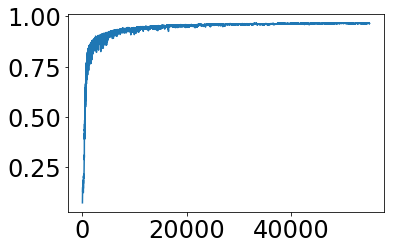

In [83]:
plt.plot(acc_list)

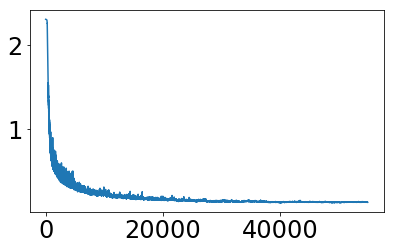

In [84]:
plt.plot(loss_list)

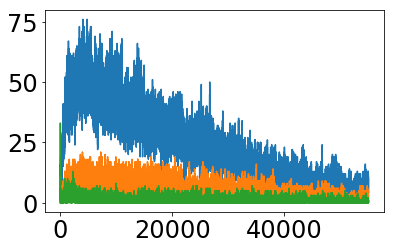

In [85]:
plt.plot(turnover_list)

In [86]:
unique_epochs = np.unique(epoch_list)

In [112]:
turnover_list_combined = np.sum(turnover_list, axis=1)
print(turnover_list_combined.shape)

(55000,)


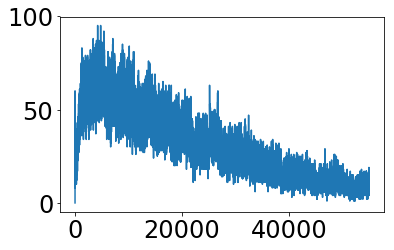

In [110]:
plt.plot(turnover_list_combined)

In [115]:
reshaped_turnover = turnover_list_combined.reshape(unique_epochs.size, 
                                                   int(turnover_list_combined.size/unique_epochs.size))
print(reshaped_turnover.shape)

(10, 5500)


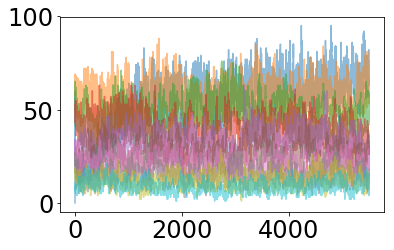

In [123]:
plt.plot(reshaped_turnover.T, alpha=.5)

In [93]:
mean_turnover_list

array([18.42648485, 18.50557576, 15.36890909, 12.77169697, 10.59072727,
        8.38315152,  6.55860606,  4.88363636,  3.98424242,  2.97642424])

In [120]:
mean_acc_list = np.mean(acc_list.reshape(unique_epochs.size, int(acc_list.size/unique_epochs.size)), axis=1)
mean_loss_list = np.mean(loss_list.reshape(unique_epochs.size, int(loss_list.size/unique_epochs.size)), axis=1)
mean_turnover_list = np.sum(turnover_list_combined.reshape(unique_epochs.size, int(turnover_list_combined.size/unique_epochs.size)), axis=1)

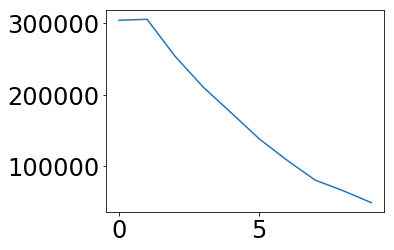

In [125]:
plt.plot(mean_turnover_list)

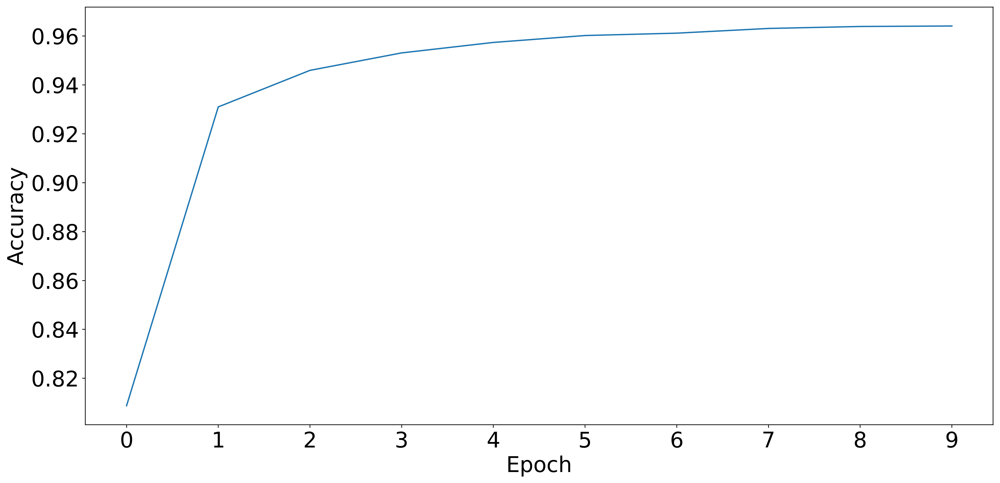

In [88]:
plt.figure(figsize=(16, 8), dpi=400)
plt.plot(unique_epochs, mean_acc_list)
plt.xticks(unique_epochs)
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.savefig("original_deep_r_acc.png")

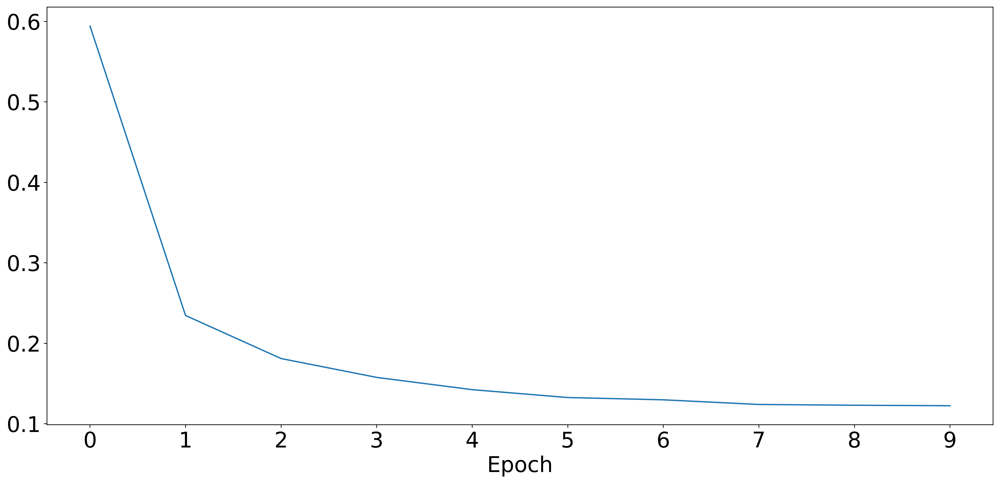

In [89]:
plt.figure(figsize=(16, 8), dpi=400)
plt.plot(unique_epochs, mean_loss_list)
plt.xticks(unique_epochs)
plt.xlabel("Epoch")
plt.savefig("original_deep_r_loss.png")

In [170]:
ada_flattened = pd.read_csv("results/results_for_lenet_300_100_relu_crossent_adadelta.csv")
sgd_flattened = pd.read_csv("results/results_for_lenet_300_100_relu_crossent_sgd.csv")
ns_flattened = pd.read_csv("results/results_for_lenet_300_100_relu_crossent_noisy_sgd.csv")
# networks with rewiring
ada_rew = pd.read_csv("results/results_for_lenet_300_100_relu_crossent_adadelta_rewiring.csv")
sgd_rew = pd.read_csv("results/results_for_lenet_300_100_relu_crossent_sgd_rewiring.csv")
ns_rew = pd.read_csv("results/results_for_lenet_300_100_relu_crossent_noisy_sgd_rewiring.csv")

# sparse networks without rewiring
ada_no_rew = pd.read_csv("results/results_for_lenet_300_100_relu_crossent_adadelta_no_rewiring.csv")
sgd_no_rew = pd.read_csv("results/results_for_lenet_300_100_relu_crossent_sgd_no_rewiring.csv")
ns_no_rew = pd.read_csv("results/results_for_lenet_300_100_relu_crossent_noisy_sgd_no_rewiring.csv")

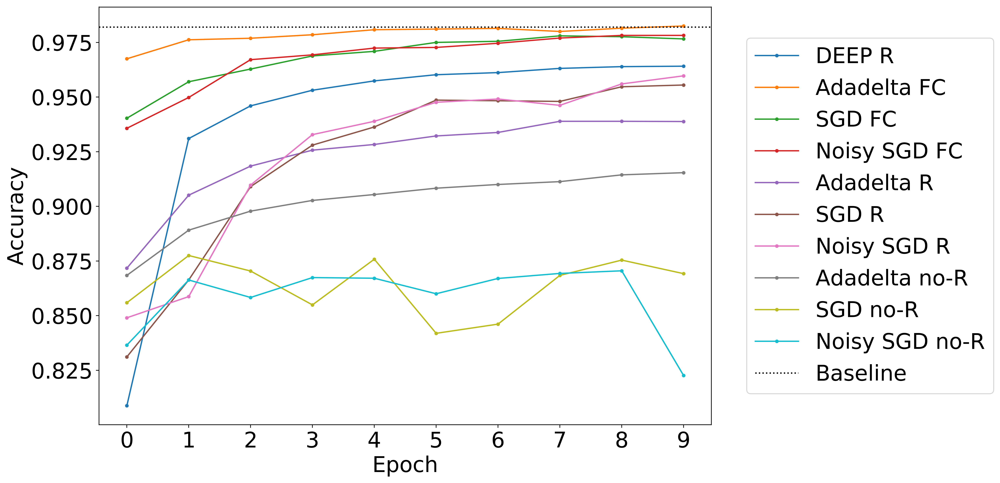

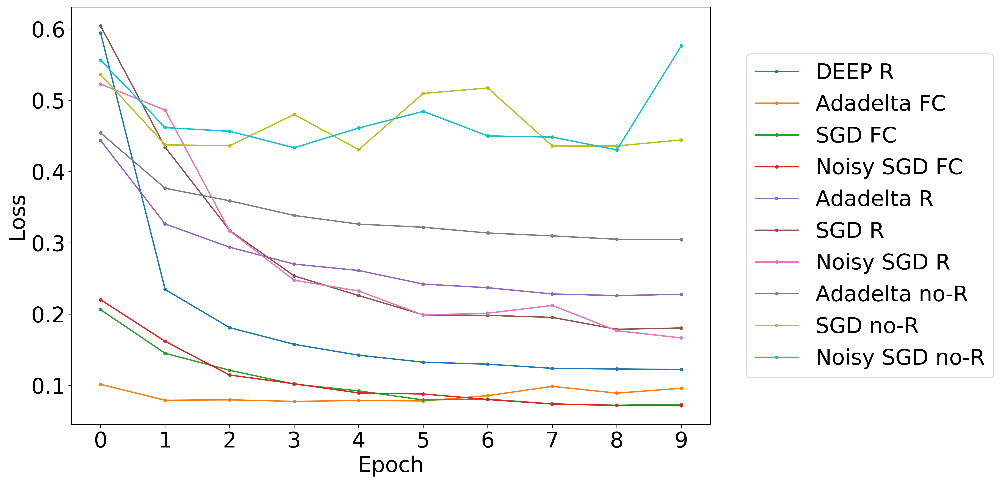

In [194]:
plt.figure(figsize=(16, 8), dpi=400)
plt.plot(unique_epochs, mean_acc_list, label="DEEP R", marker=".")
plt.plot(unique_epochs, ada_flattened['val_acc'], label="Adadelta FC", marker=".")
plt.plot(unique_epochs, sgd_flattened['val_acc'], label="SGD FC", marker=".")
plt.plot(unique_epochs, ns_flattened['val_acc'], label="Noisy SGD FC", marker=".")
plt.plot(unique_epochs, ada_rew['val_acc'], label="Adadelta R", marker=".")
plt.plot(unique_epochs, sgd_rew['val_acc'], label="SGD R", marker=".")
plt.plot(unique_epochs, ns_rew['val_acc'], label="Noisy SGD R", marker=".")
plt.plot(unique_epochs, ada_no_rew['val_acc'], label="Adadelta no-R", marker=".")
plt.plot(unique_epochs, sgd_no_rew['val_acc'], label="SGD no-R", marker=".")
plt.plot(unique_epochs, ns_no_rew['val_acc'], label="Noisy SGD no-R", marker=".")

plt.axhline(0.982, c="k", ls=":", label="Baseline")
plt.xticks(unique_epochs)
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
# plt.legend(loc="best")
plt.legend(bbox_to_anchor=(1.04,0.5), loc="center left")
plt.savefig("original_deep_r_acc_vs_ours.png")

plt.figure(figsize=(16, 8), dpi=400)
plt.plot(unique_epochs, mean_loss_list, label="DEEP R", marker=".")
plt.plot(unique_epochs, ada_flattened['val_loss'], label="Adadelta FC", marker=".")
plt.plot(unique_epochs, sgd_flattened['val_loss'], label="SGD FC", marker=".")
plt.plot(unique_epochs, ns_flattened['val_loss'], label="Noisy SGD FC", marker=".")
plt.plot(unique_epochs, ada_rew['val_loss'], label="Adadelta R", marker=".")
plt.plot(unique_epochs, sgd_rew['val_loss'], label="SGD R", marker=".")
plt.plot(unique_epochs, ns_rew['val_loss'], label="Noisy SGD R", marker=".")
plt.plot(unique_epochs, ada_no_rew['val_loss'], label="Adadelta no-R", marker=".")
plt.plot(unique_epochs, sgd_no_rew['val_loss'], label="SGD no-R", marker=".")
plt.plot(unique_epochs, ns_no_rew['val_loss'], label="Noisy SGD no-R", marker=".")
plt.xticks(unique_epochs)
plt.xlabel("Epoch")
plt.ylabel("Loss")
# plt.yscale("log")
# plt.legend(loc="best")
plt.legend(bbox_to_anchor=(1.04,0.5), loc="center left")
plt.savefig("original_deep_r_loss_vs_ours.png")

In [213]:
(mean_acc_list - ns_rew['val_acc']) * 100

0   -4.022582
1    7.231031
2    3.626840
3    2.030873
4    1.848763
5    1.261617
6    1.208326
7    1.690914
8    0.791708
9    0.440847
Name: val_acc, dtype: float64

In [214]:
(mean_acc_list - ada_rew['val_acc']) * 100

0   -6.292582
1    2.591031
2    2.756840
3    2.740873
4    2.908763
5    2.801617
6    2.738326
7    2.420914
8    2.501708
9    2.530847
Name: val_acc, dtype: float64

In [221]:
(ada_flattened['val_acc'] - ns_flattened['val_acc']) * 100

0    3.18
1    2.64
2    0.98
3    0.92
4    0.84
5    0.84
6    0.68
7    0.30
8    0.33
9    0.43
Name: val_acc, dtype: float64

In [215]:
def plot_rewires_and_accuracy_vs_original(pd, name, mean_acc_list=mean_acc_list, mean_turnover_list=mean_turnover_list):
    fig, ax1 = plt.subplots(figsize=(16, 8), dpi=400)

    # color = 'tab:red'
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Accuracy')
    lns1 = ax1.plot(pd['epoch'], pd['val_acc'], color='C0', label="KERAS R Accuracy")

    lns1 += ax1.plot(pd['epoch'], mean_acc_list, color='C0', ls=":", label="DEEP R Accuracy")
    # ax1.tick_params(axis='y', labelcolor=color)
    ax1.axhline(ada_flattened['acc'].iloc[-1], c="k", ls=":", label="Baseline")

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    # color = 'tab:blue'
    ax2.set_ylabel('Number of rewires')  # we already handled the x-label with ax1
    lns2 = ax2.plot(unique_epochs, pd['no_rewires_for_layer_sparse_1'] +
                    pd['no_rewires_for_layer_sparse_2'] +
                    pd['no_rewires_for_layer_sparse_3']
                    , color='C1', label="# rewires total KR")
    lns2 += ax2.plot(unique_epochs, mean_turnover_list
                    , color='C1', ls=":", label="# rewires total DR")
    # lns3 = ax2.plot(unique_epochs, ada_rew['no_rewires_for_layer_sparse_2'], color='C2', label="# rewires L2")
    # lns4 = ax2.plot(unique_epochs, ada_rew['no_rewires_for_layer_sparse_3'], color='C3', label="# rewires L2")
    # ax2.tick_params(axis='y', labelcolor=color)

    # added these three lines
    lns = lns1+lns2#+lns3+lns4
    labs = [l.get_label() for l in lns]
    ax1.legend(lns, labs, loc='center right')
    plt.xticks(unique_epochs)
    # ax1.legend(loc=0)
    # ax2.legend(loc="best")
    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.savefig("keras_r_{}_no_rewires.png".format(name))


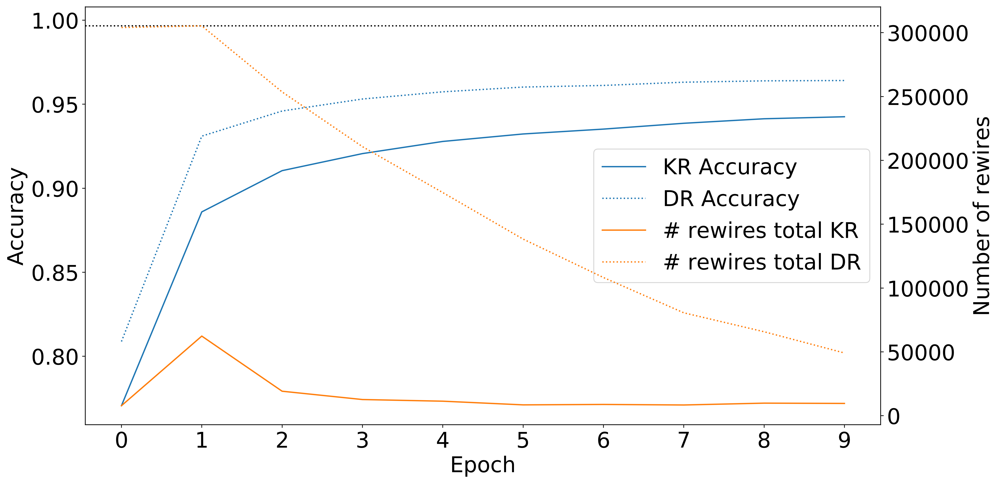

In [178]:
fig, ax1 = plt.subplots(figsize=(16, 8), dpi=400)

# color = 'tab:red'
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy')
lns1 = ax1.plot(unique_epochs, ada_rew['acc'], color='C0', label="KR Accuracy")

lns1 += ax1.plot(unique_epochs, mean_acc_list, color='C0', ls=":", label="DR Accuracy")
# ax1.tick_params(axis='y', labelcolor=color)
ax1.axhline(ada_flattened['acc'].iloc[-1], c="k", ls=":", label="Baseline")

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

# color = 'tab:blue'
ax2.set_ylabel('Number of rewires')  # we already handled the x-label with ax1
lns2 = ax2.plot(unique_epochs, ada_rew['no_rewires_for_layer_sparse_1'] +
                ada_rew['no_rewires_for_layer_sparse_2'] +
                ada_rew['no_rewires_for_layer_sparse_3']
                , color='C1', label="# rewires total KR")
lns2 += ax2.plot(unique_epochs, mean_turnover_list
                , color='C1', ls=":", label="# rewires total DR")
# lns3 = ax2.plot(unique_epochs, ada_rew['no_rewires_for_layer_sparse_2'], color='C2', label="# rewires L2")
# lns4 = ax2.plot(unique_epochs, ada_rew['no_rewires_for_layer_sparse_3'], color='C3', label="# rewires L2")
# ax2.tick_params(axis='y', labelcolor=color)

# added these three lines
lns = lns1+lns2#+lns3+lns4
labs = [l.get_label() for l in lns]
ax1.legend(lns, labs, loc='center right')
plt.xticks(unique_epochs)
# ax1.legend(loc=0)
# ax2.legend(loc="best")
fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.savefig("keras_r_no_rewires.png")


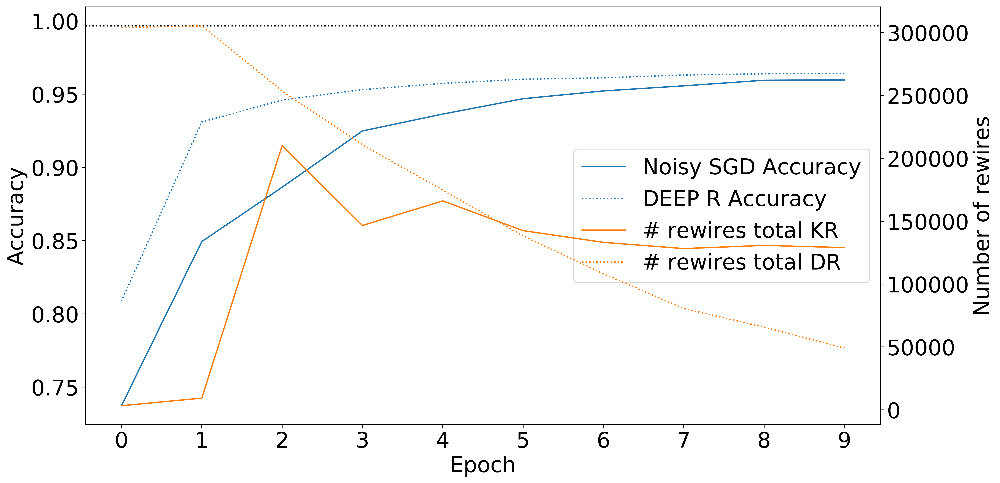

In [202]:
fig, ax1 = plt.subplots(figsize=(16, 8), dpi=400)

# color = 'tab:red'
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy')
lns1 = ax1.plot(unique_epochs, ns_rew['acc'], color='C0', label="Noisy SGD Accuracy")

lns1 += ax1.plot(unique_epochs, mean_acc_list, color='C0', ls=":", label="DEEP R Accuracy")
# ax1.tick_params(axis='y', labelcolor=color)
ax1.axhline(ada_flattened['acc'].iloc[-1], c="k", ls=":", label="Baseline")

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

# color = 'tab:blue'
ax2.set_ylabel('Number of rewires')  # we already handled the x-label with ax1
lns2 = ax2.plot(unique_epochs, ns_rew['no_rewires_for_layer_sparse_1'] +
                ns_rew['no_rewires_for_layer_sparse_2'] +
                ns_rew['no_rewires_for_layer_sparse_3']
                , color='C1', label="# rewires total KR")
lns2 += ax2.plot(unique_epochs, mean_turnover_list
                , color='C1', ls=":", label="# rewires total DR")
# lns3 = ax2.plot(unique_epochs, ada_rew['no_rewires_for_layer_sparse_2'], color='C2', label="# rewires L2")
# lns4 = ax2.plot(unique_epochs, ada_rew['no_rewires_for_layer_sparse_3'], color='C3', label="# rewires L2")
# ax2.tick_params(axis='y', labelcolor=color)

# added these three lines
lns = lns1+lns2#+lns3+lns4
labs = [l.get_label() for l in lns]
ax1.legend(lns, labs, loc='center right')
plt.xticks(unique_epochs)
# ax1.legend(loc=0)
# ax2.legend(loc="best")
fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.savefig("keras_r_noisy_sgd_no_rewires.png")


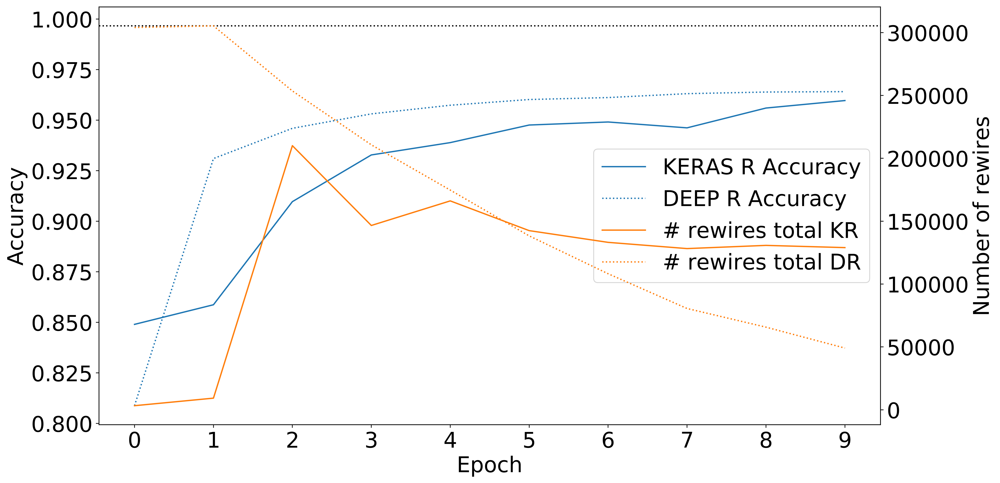

In [216]:
plot_rewires_and_accuracy_vs_original(ns_rew, "noisy_sgd")

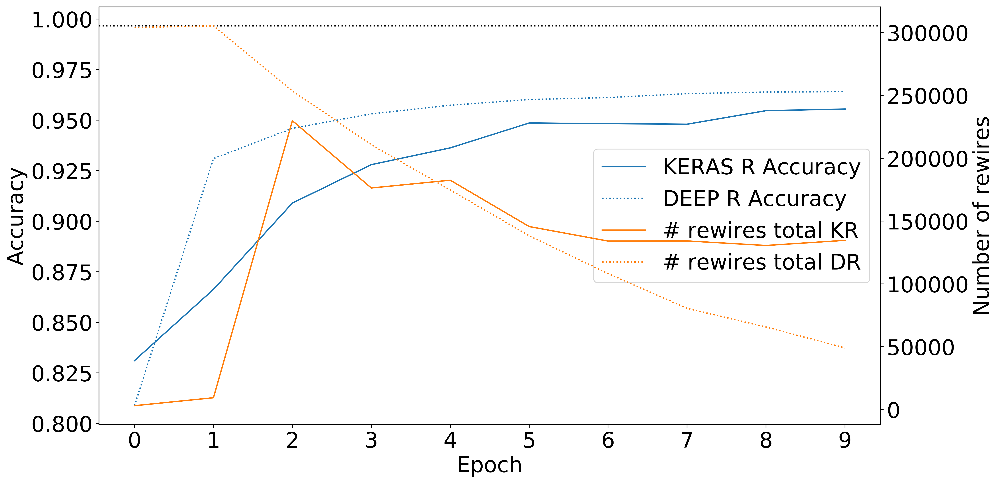

In [217]:
plot_rewires_and_accuracy_vs_original(sgd_rew, "sgd")

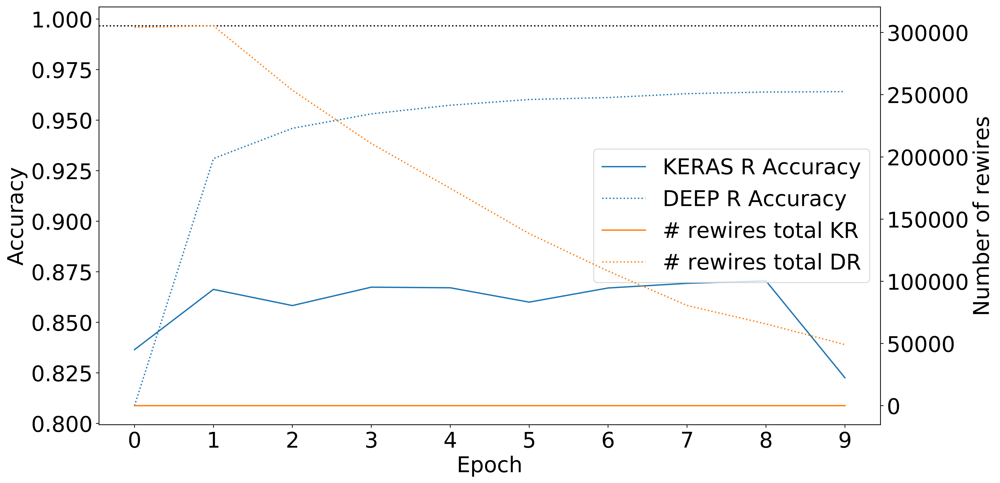

In [218]:
plot_rewires_and_accuracy_vs_original(ns_no_rew, "ns_no_rew")

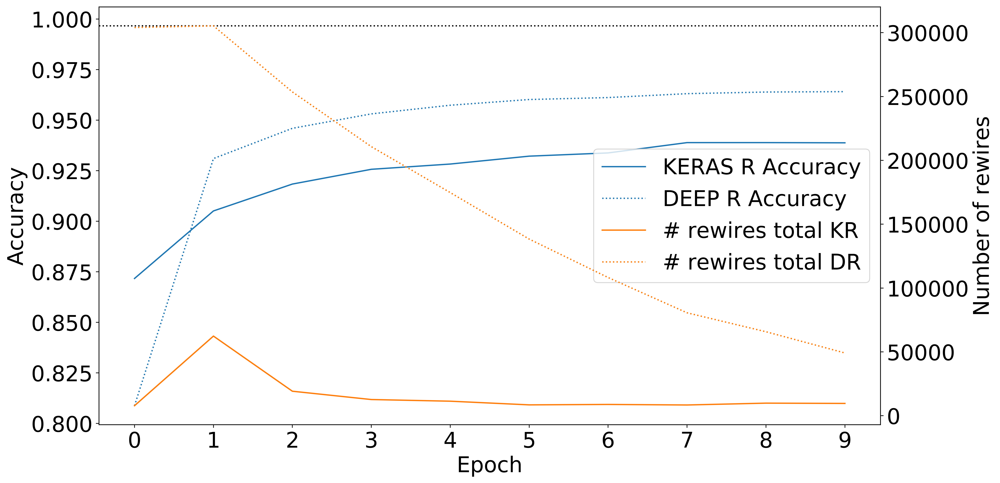

In [219]:
plot_rewires_and_accuracy_vs_original(ada_rew, "ada_rew")

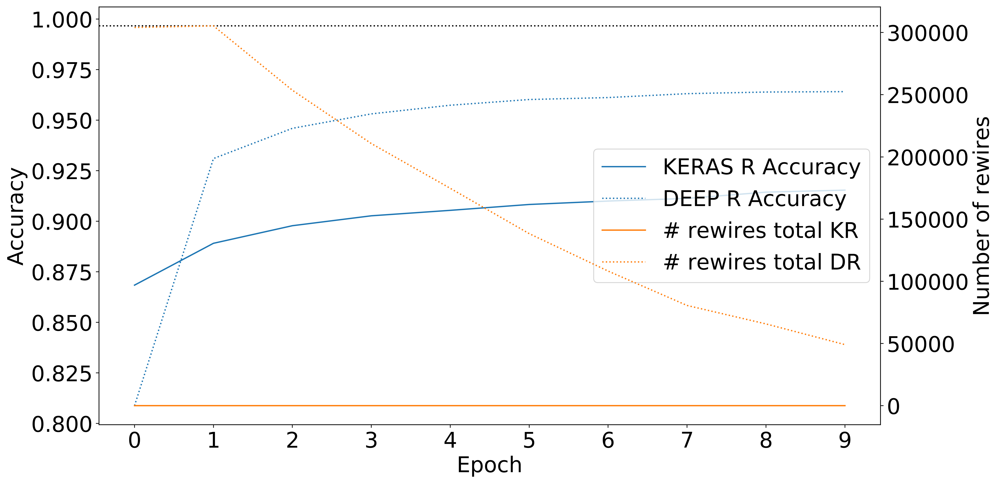

In [220]:
plot_rewires_and_accuracy_vs_original(ada_no_rew, "ada_no_rew")

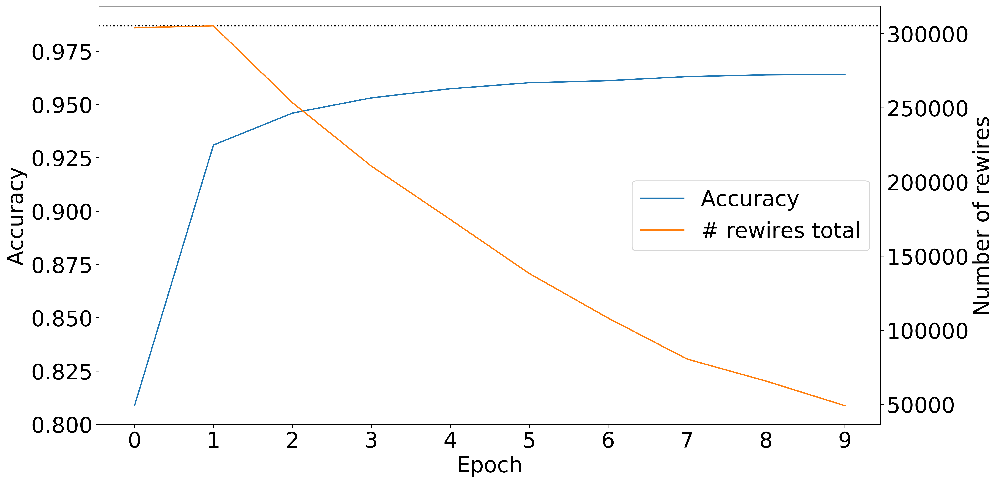

In [109]:
fig, ax1 = plt.subplots(figsize=(16, 8), dpi=400)

# color = 'tab:red'
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy')
lns1 = ax1.plot(unique_epochs, mean_acc_list, label="Accuracy")
# ax1.tick_params(axis='y', labelcolor=color)
ax1.axhline(ada_flattened['acc'].iloc[-1], c="k", ls=":", label="Baseline")

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

# color = 'tab:blue'
ax2.set_ylabel('Number of rewires')  # we already handled the x-label with ax1
lns2 = ax2.plot(unique_epochs, mean_turnover_list
                , color='C1', label="# rewires total")
# lns3 = ax2.plot(unique_epochs, ada_rew['no_rewires_for_layer_sparse_2'], color='C2', label="# rewires L2")
# lns4 = ax2.plot(unique_epochs, ada_rew['no_rewires_for_layer_sparse_3'], color='C3', label="# rewires L2")
# ax2.tick_params(axis='y', labelcolor=color)

# added these three lines
lns = lns1+lns2#+lns3+lns4
labs = [l.get_label() for l in lns]
ax1.legend(lns, labs, loc='center right')
plt.xticks(unique_epochs)
# ax1.legend(loc=0)
# ax2.legend(loc="best")
fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.savefig("deep_r_no_rewires.png")

In [105]:
mean_acc_list - ada_rew['acc']

0    0.044483
1    0.059823
2    0.047698
3    0.041942
4    0.037513
5    0.034904
6    0.031225
7    0.029942
8    0.027521
9    0.026233
Name: acc, dtype: float64

In [139]:
ada_no_rew

,epoch,acc,loss,top_k_categorical_accuracy,val_acc,val_loss,val_top_k_categorical_accuracy
0,0,0.785133,0.744781,0.967583,0.8719,0.440579,0.9908
1,1,0.876600,0.424893,0.990350,0.8900,0.376241,0.9925
2,2,0.890217,0.379483,0.991933,0.8967,0.357287,0.9928
3,3,0.897383,0.356091,0.992833,0.9021,0.337343,0.9936
4,4,0.903067,0.340937,0.993450,0.9082,0.329764,0.9933
5,5,0.906017,0.330944,0.993800,0.9078,0.324644,0.9939
6,6,0.909283,0.323055,0.993850,0.9117,0.316684,0.9942
7,7,0.910267,0.316933,0.994283,0.9102,0.315191,0.9944
8,8,0.912450,0.312850,0.994267,0.9158,0.305108,0.9949
9,9,0.914100,0.308844,0.994333,0.9151,0.306786,0.9940


In [148]:
ns_rew

,epoch,acc,loss,no_connections_sparse_1,no_connections_sparse_2,no_connections_sparse_3,no_rewires_for_layer_sparse_1,no_rewires_for_layer_sparse_2,no_rewires_for_layer_sparse_3,proportion_connections_sparse_1,proportion_connections_sparse_2,proportion_connections_sparse_3,top_k_categorical_accuracy,val_acc,val_loss,val_top_k_categorical_accuracy
0,0.00,0.104767,2.407268,2352.0000,900.000000,300.0000,7.0,0.0,0.0,0.01,0.03,0.3,0.515667,0.1028,2.407279,0.5105
1,1.00,0.104417,2.406824,2352.0000,900.000000,300.0000,0.0,0.0,0.0,0.01,0.03,0.3,0.515167,0.1028,2.407083,0.5106
2,2.00,0.104417,2.406702,2352.0000,900.000000,300.0000,0.0,0.0,0.0,0.01,0.03,0.3,0.515350,0.1028,2.406979,0.5107
3,3.00,0.104417,2.406629,2352.0000,900.000000,300.0000,0.0,0.0,0.0,0.01,0.03,0.3,0.515483,0.1028,2.406908,0.5107
4,4.00,0.104417,2.406577,2352.0000,900.000000,300.0000,0.0,1.0,0.0,0.01,0.03,0.3,0.515567,0.1028,2.406855,0.5107
5,5.00,0.104417,2.406536,2352.0000,900.000000,300.0000,0.0,0.0,0.0,0.01,0.03,0.3,0.515700,0.1028,2.406811,0.5107
6,6.00,0.104417,2.406502,2352.0000,900.000000,300.0000,0.0,0.0,0.0,0.01,0.03,0.3,0.515733,0.1028,2.406775,0.5107
7,7.00,0.104417,2.406474,2352.0000,900.000000,300.0000,0.0,0.0,0.0,0.01,0.03,0.3,0.515767,0.1028,2.406744,0.5107
8,8.00,0.104417,2.406449,2352.0000,900.000000,300.0000,0.0,0.0,0.0,0.01,0.03,0.3,0.515833,0.1028,2.406717,0.5107
9,9.00,0.104433,2.406428,2352.0000,900.000000,300.0000,0.0,0.0,0.0,0.01,0.03,0.3,0.515933,0.1028,2.406694,0.5107


In [188]:
_alpha = .3

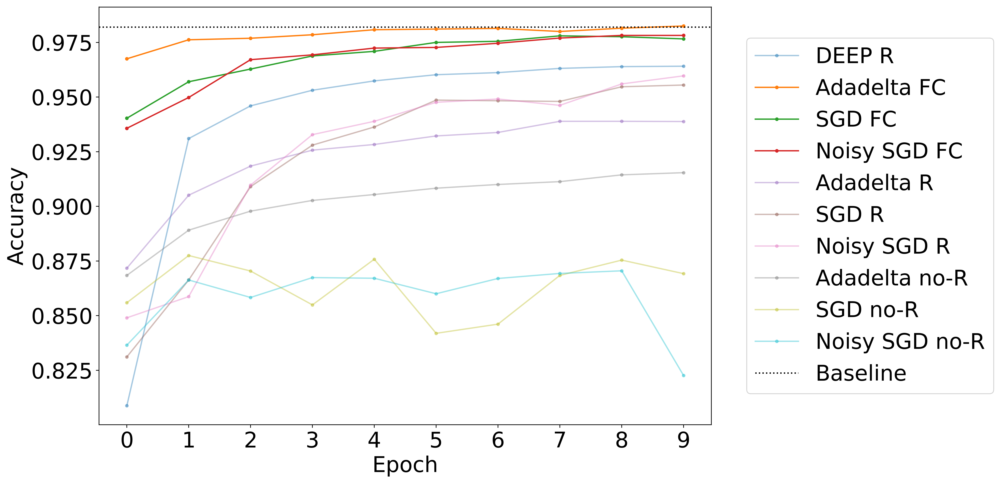

In [200]:
plt.figure(figsize=(16, 8), dpi=400)
plt.plot(unique_epochs, mean_acc_list, label="DEEP R", marker=".", alpha=_alpha)
plt.plot(unique_epochs, ada_flattened['val_acc'], label="Adadelta FC", marker=".")
plt.plot(unique_epochs, sgd_flattened['val_acc'], label="SGD FC", marker=".")
plt.plot(unique_epochs, ns_flattened['val_acc'], label="Noisy SGD FC", marker=".")
plt.plot(unique_epochs, ada_rew['val_acc'], label="Adadelta R", marker=".", alpha=_alpha)
plt.plot(unique_epochs, sgd_rew['val_acc'], label="SGD R", marker=".", alpha=_alpha)
plt.plot(unique_epochs, ns_rew['val_acc'], label="Noisy SGD R", marker=".", alpha=_alpha)
plt.plot(unique_epochs, ada_no_rew['val_acc'], label="Adadelta no-R", marker=".", alpha=_alpha)
plt.plot(unique_epochs, sgd_no_rew['val_acc'], label="SGD no-R", marker=".", alpha=_alpha)
plt.plot(unique_epochs, ns_no_rew['val_acc'], label="Noisy SGD no-R", marker=".", alpha=_alpha)

plt.axhline(0.982, c="k", ls=":", label="Baseline")
plt.xticks(unique_epochs)
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
# plt.legend(loc="best")
plt.legend(bbox_to_anchor=(1.04,0.5), loc="center left")
plt.savefig("original_deep_r_acc_vs_ours_hightlight_fc.png")

# plt.figure(figsize=(16, 8), dpi=400)
# plt.plot(unique_epochs, mean_loss_list, label="DEEP R", marker=".")
# plt.plot(unique_epochs, ada_flattened['loss'], label="Adadelta FC", marker=".")
# plt.plot(unique_epochs, sgd_flattened['loss'], label="SGD FC", marker=".")
# plt.plot(unique_epochs, ns_flattened['loss'], label="Noisy SGD FC", marker=".")
# plt.plot(unique_epochs, ada_rew['loss'], label="Adadelta R", marker=".")
# plt.plot(unique_epochs, sgd_rew['loss'], label="SGD R")
# plt.plot(unique_epochs, ns_rew['loss'], label="Noisy SGD R", marker=".")
# plt.plot(unique_epochs, ada_no_rew['loss'], label="Adadelta no-R", marker=".")
# plt.plot(unique_epochs, sgd_no_rew['loss'], label="SGD no-R", marker=".")
# plt.plot(unique_epochs, ns_no_rew['loss'], label="Noisy SGD no-R", marker=".")
# plt.xticks(unique_epochs)
# plt.xlabel("Epoch")
# plt.ylabel("Loss")
# # plt.yscale("log")
# # plt.legend(loc="best")
# plt.legend(bbox_to_anchor=(1.04,0.5), loc="center left")
# plt.savefig("original_deep_r_loss_vs_ours.png")

In [250]:
pretrained_relu_ada = load_model("models/trained_model_of_lenet_300_100_relu_crossent_noisy_sgd_rewiring", 
                                 custom_objects={'Sparse': Sparse, 
                                                'NoisySGD':NoisySGD}) 

In [251]:
pretrained_relu_ada.optimizer.gradient_noise_coeefficient

1e-06

In [252]:
pretrained_relu_ada.optimizer.temperature

0.0